# Apr 4th, 2022 (ca ref; viz some t)

**Motivation**: I first plot reference images for calcium, along with tSNR.  Then I make a GS plot for both modalities and save it.  Next, I visualize some of the timepoints for Ca data (imshow).  Finally, I found that softmax doesn't really work. <br>

In [1]:
# HIDE CODE


import os
import sys
from pprint import pprint
from copy import deepcopy as dc
from os.path import join as pjoin
from numpy.ma import masked_where as mwh
from IPython.display import display, IFrame, HTML

# tmp & extras dir
git_dir = pjoin(os.environ['HOME'], 'Dropbox/git')
tmp_dir = pjoin(git_dir, 'jb-Ca-fMRI/tmp')
fig_dir = pjoin(git_dir, 'jb-Ca-fMRI/figs')
extras_dir = pjoin(git_dir, 'jb-Ca-fMRI/_extras')
lfr_dir = 'Documents/workspaces/lfr/binary_overlapping'
lfr_dir = pjoin(os.environ['HOME'], lfr_dir)

# GitHub
sys.path.insert(0, pjoin(git_dir, '_Ca-fMRI'))
from register.atlas import make_tree_graph
from register.parcellation import Parcellation
from analysis.hierarchical import Hierarchical
from analysis.fourier import *
from analysis.bootstrap import *
from analysis.svinet import *
from analysis.group import *
from analysis.lfr import *
from utils.render import *
from utils.plotting import *
from model.mouse import Mice
from model.configuration import Config

# set style & no interpolalation
matplotlib.rcParams['image.interpolation'] = 'none'
sns.set_style('whitegrid')
%matplotlib inline

# warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

## Check data is loaded

In [2]:
mice = Mice(128)

In [3]:
mice.setup_anat_data()
mice.setup_preproc_data()

In [4]:
len(mice.T1w), len(mice.ref), len(mice.mask2d), len(mice.mask3d)

(30, 30, 30, 30)

In [5]:
save_dir = pjoin(fig_dir, 'quality_control')
os.makedirs(save_dir, exist_ok=True)

save_dir

'/home/hadi/Dropbox/git/jb-Ca-fMRI/figs/quality_control'

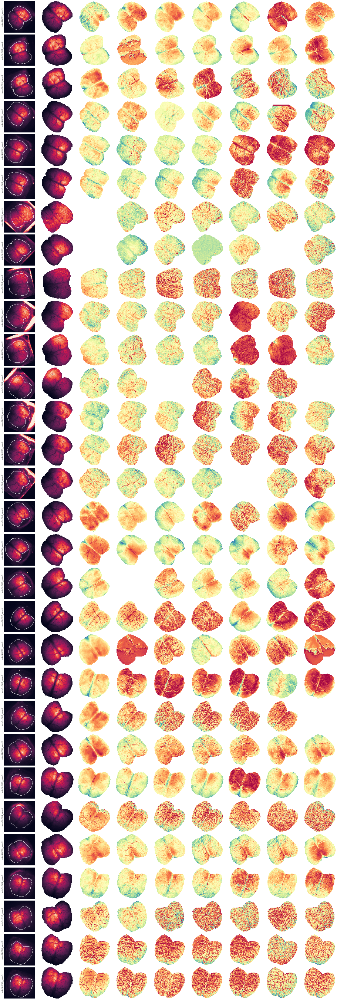

In [6]:
nrows = len(mice.ref)
fig, axes = create_figure(nrows, 9, (26, 2.5 * nrows), dpi=36)

tstart = 1000
for i, (k, anat) in enumerate(mice.ref.items()):
    axes[i, 0].set_ylabel(k, fontsize=12)
    
    m = mice.mask2d[k].load_ants().numpy().squeeze().astype(bool)
    ref = anat.load_ants().numpy().squeeze().astype(float)
    ref = sp_img.zoom(ref, 0.5)
    
    tsnr = []
    for run in mice.cfg.run_ids:
        key = mice.get_key(*mice.looper[k][:-1], run)
        x = mice.ca_preproc[key].load_ants()
        if x is not None:
            x = x.numpy().squeeze()
            tsnr.append(np.abs(x[..., tstart:].mean(-1)) / x[..., tstart:].std(-1))
        else:
            tsnr.append(np_nans(m.shape))
    
    contour = np.logical_or(
        sp_img.sobel(m, axis=0),
        sp_img.sobel(m, axis=1),
    )
    ax = axes[i, 0]
    ax.imshow(ref, vmax=np.max(ref * m))
    x2p = mwh(contour == 0, contour)
    ax.imshow(x2p, cmap='Greys', alpha=0.8)
    
    filtered = filter_boundaries([ref, m] + tsnr, m)
    ref, m = filtered[:2]
    tsnr = filtered[2:]
    
    ax = axes[i, 1]
    x2p = mwh(m == 0, ref)
    ax.imshow(x2p)
    
    for j, x in enumerate(tsnr, start=2):
        ax = axes[i, j]
        x2p = mwh(m == 0, x)
        ax.imshow(x2p, cmap='Spectral')

remove_ticks(axes)
fig.savefig(pjoin(save_dir, 'Ref_vs_masks.pdf'), bbox_inches='tight')
plt.show()

## Temporal masks
Is it mostly first 50 seconds?  No, it's all over the place.

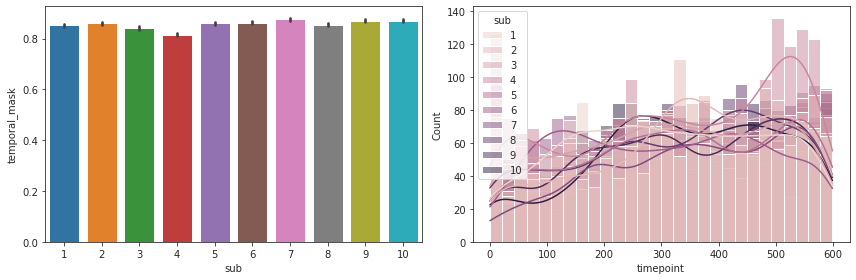

In [44]:
df = pd.read_pickle(pjoin(mice.cfg.base_dir, 'meta_info', 'temporal_mask.df'))

fig, axes = create_figure(1, 2, figsize=(12, 4))
sns.barplot(data=df, x='sub', y='temporal_mask', ax=axes[0])
_df = df.loc[df['temporal_mask'] == 0]
sns.histplot(data=_df, x='timepoint', kde=True, hue='sub', ax=axes[1])

plt.show()

## Plot of all normalized ca GSR 

In [62]:
gs_ca, gs_bold = {}, {}
for k, (sub, ses, run) in tqdm(mice.looper.items()):
    if run == -1:
        continue
    m = mice.mask2d[mice.get_key(sub, ses)]
    m = m.load_ants().numpy().squeeze().astype(bool)
    x = mice.ca_preproc[k].load_ants()
    gs = np_nans(6000)
    if x is not None:
        x = x.numpy().squeeze()
        gs = x[m].mean(0)
    gs_ca[k] = gs
    
    m = mice.mask3d[mice.get_key(sub, ses)]
    m = m.load_ants().numpy().squeeze().astype(bool)
    x = mice.bold_preproc[k].load_ants()
    tmask = df.loc[
        (df['sub'] == sub) &
        (df['ses'] == ses) &
        (df['run'] == run),
        'temporal_mask',
    ].values.astype(bool)
    gs = np_nans(600)
    if x is not None:
        x = x.numpy().squeeze()
        gs[tmask] = x[m].mean(0)
    gs_bold[k] = gs

  0%|          | 0/254 [00:00<?, ?it/s]

In [116]:
figs, sups = [], []
for sub in mice.cfg.sub_ids:
    fig, axes = create_figure(2, 3, (13, 6), sharey='row', dpi=72)
    tstart = 1000
    for ses in mice.cfg.ses_ids:
        #if ses == 3:
        #    axtwix = ax.twinx()
        #    axtwix.set_ylabel(f'sub-SLC{sub:02d}_ses-{ses} (CA)', rotation=-90, fontsize=14, labelpad=20)
        #    axtwix.set_yticks([])
        for run in mice.cfg.run_ids:
            ax = axes[0, ses - 1]
            ax.axvline(tstart, color='dimgrey', ls='--', lw=1)
            ax.plot(gs_ca[f'sub-SLC{sub:02d}_ses-{ses}_run-{run}'], lw=1, alpha=0.7)
            ax = axes[1, ses - 1]
            ax.axvline(tstart // 10, color='dimgrey', ls='--', lw=1)
            ax.plot(gs_bold[f'sub-SLC{sub:02d}_ses-{ses}_run-{run}'], lw=1, alpha=0.7)
        #if ses == 3:
        #    axtwix = ax.twinx()
        #    axtwix.set_ylabel(f'sub-SLC{sub:02d}_ses-{ses} (BOLD)', rotation=-90, fontsize=14, labelpad=20)
        #   axtwix.set_yticks([])
        #for run in mice.cfg.run_ids:

    sup = fig.suptitle(f'sub-SLC{sub:02d}_ses-{ses} (GS --> top: CA, bottom: BOLD)', fontsize=17, y=1.02)
    figs.append(fig)
    sups.append(sup)
    plt.close()

In [117]:
save_dir

'/home/hadi/Dropbox/git/jb-Ca-fMRI/figs/quality_control'

In [118]:
save_fig(figs, sups, pjoin(save_dir, 'GS.pdf'), multi=True)

In [151]:
nb_std = 5

<matplotlib.lines.Line2D object at 0x7fc2c1dcaf40>

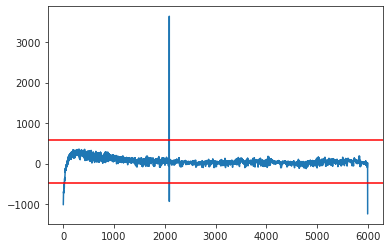

In [165]:
sub, ses, run = 6, 1, 2
x = gs_ca[f'sub-SLC{sub:02d}_ses-{ses}_run-{run}']
sd = x.std()
plt.plot(x)
plt.axhline(x.mean() + sd * nb_std, color='r')
plt.axhline(x.mean() - sd * nb_std, color='r')

In [169]:
ids = np.where(np.logical_or(
    x > x.mean() + sd * nb_std,
    x < x.mean() - sd * nb_std,
))[0]
ids

array([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
         11,   12,   13,   14,   15,   16,   17,   18,   19,   20,   21,
       2089, 2090, 5999])

In [172]:
ca = mice.ca_preproc[f'sub-SLC{sub:02d}_ses-{ses}_run-{run}'].load_ants()
ca = ca.numpy().squeeze()

In [190]:
m = mice.mask2d[f'sub-SLC{sub:02d}_ses-{ses}'].load_ants()
m = m.numpy().squeeze().astype(bool)

<matplotlib.colorbar.Colorbar object at 0x7fc2ab4364c0>

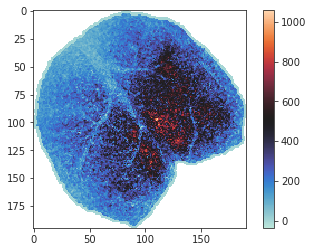

In [191]:
x2p, m_tr = filter_boundaries([ca[..., 500], m], m)
x2p = mwh(m_tr == 0, x2p)
plt.imshow(x2p, cmap='icefire')
plt.colorbar()

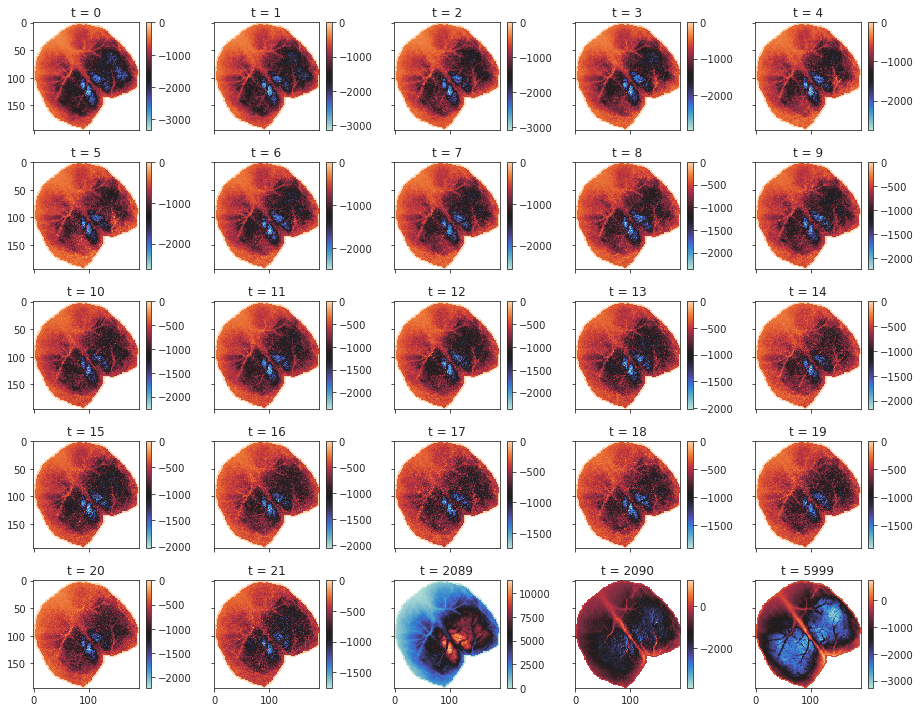

In [192]:
fig, axes = create_figure(5, 5, (13, 10), 'all', 'all')
for ax, t in zip(axes.flat, ids):
    x2p, m_tr = filter_boundaries([ca[..., t], m], m)
    x2p = mwh(m_tr == 0, x2p)
    im = ax.imshow(x2p, cmap='icefire')
    plt.colorbar(im, ax=ax)
    ax.set_title(f"t = {t}")

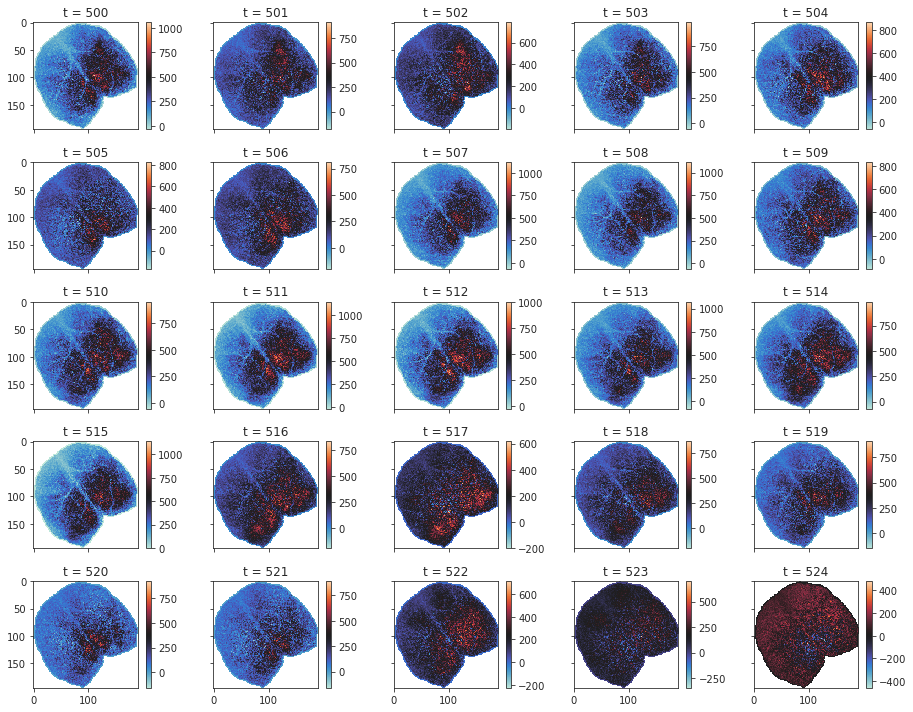

In [193]:
fig, axes = create_figure(5, 5, (13, 10), 'all', 'all')
for ax, t in zip(axes.flat, range(500, 525)):
    x2p, m_tr = filter_boundaries([ca[..., t], m], m)
    x2p = mwh(m_tr == 0, x2p)
    im = ax.imshow(x2p, cmap='icefire')
    plt.colorbar(im, ax=ax)
    ax.set_title(f"t = {t}")

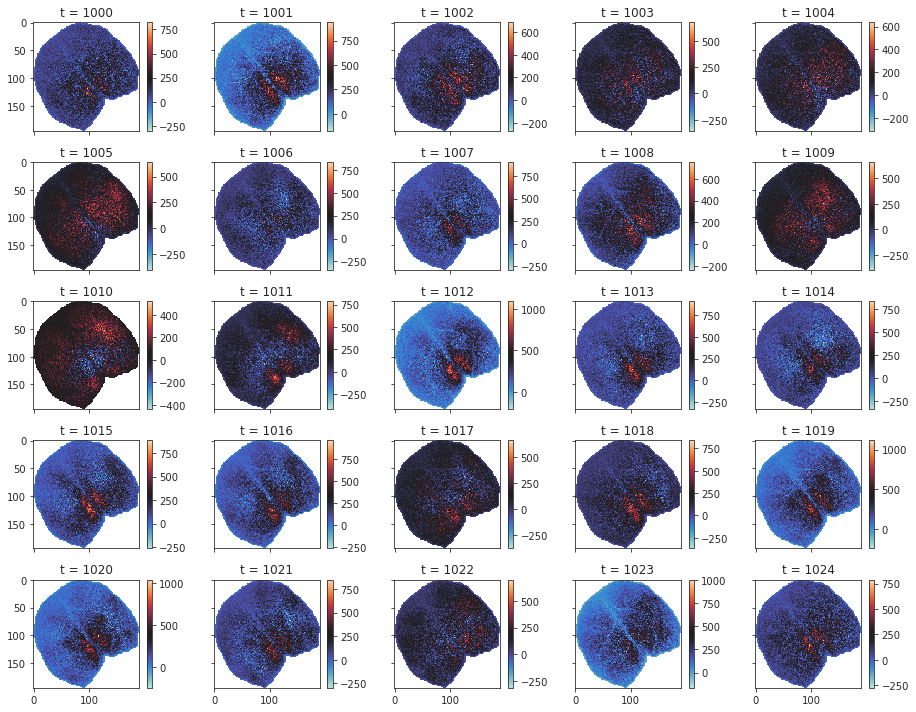

In [194]:
fig, axes = create_figure(5, 5, (13, 10), 'all', 'all')
for ax, t in zip(axes.flat, range(1000, 1025)):
    x2p, m_tr = filter_boundaries([ca[..., t], m], m)
    x2p = mwh(m_tr == 0, x2p)
    im = ax.imshow(x2p, cmap='icefire')
    plt.colorbar(im, ax=ax)
    ax.set_title(f"t = {t}")

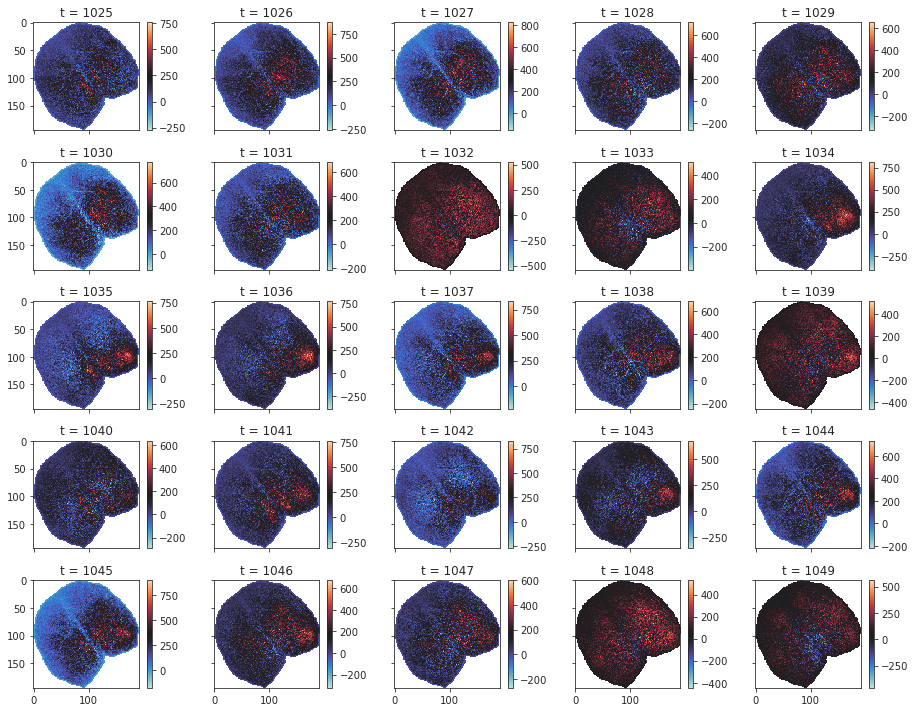

In [195]:
fig, axes = create_figure(5, 5, (13, 10), 'all', 'all')
for ax, t in zip(axes.flat, range(1025, 1050)):
    x2p, m_tr = filter_boundaries([ca[..., t], m], m)
    x2p = mwh(m_tr == 0, x2p)
    im = ax.imshow(x2p, cmap='icefire')
    plt.colorbar(im, ax=ax)
    ax.set_title(f"t = {t}")

In [196]:
ca_z = sp_stats.zscore(ca[..., 1000:], axis=-1)
ca_z.shape

(256, 250, 5000)

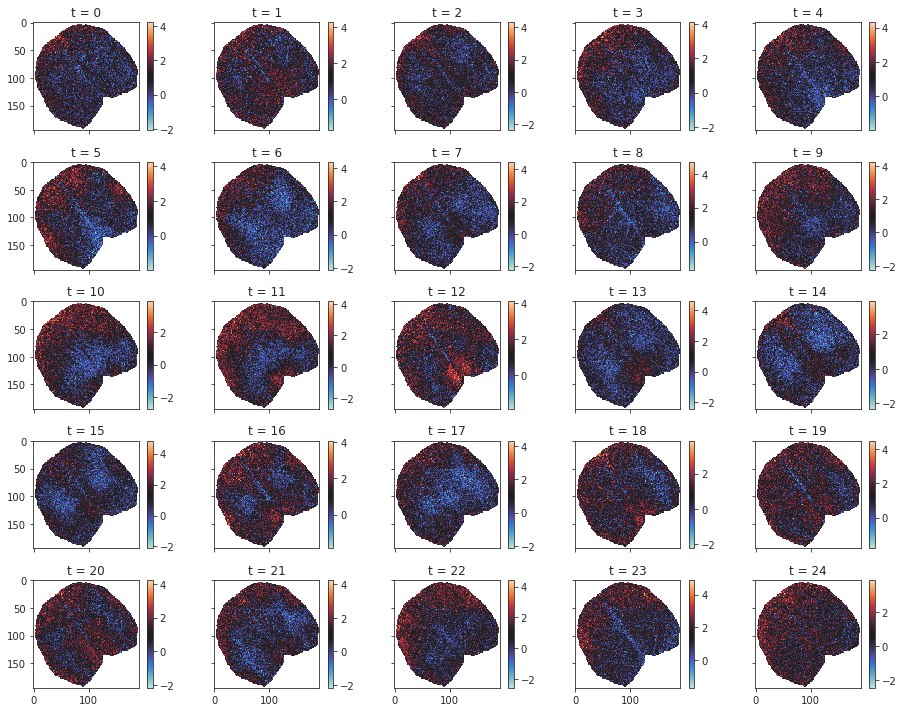

In [200]:
fig, axes = create_figure(5, 5, (13, 10), 'all', 'all')
for ax, t in zip(axes.flat, range(25)):
    x2p, m_tr = filter_boundaries([ca_z[..., t], m], m)
    x2p = mwh(m_tr == 0, x2p)
    im = ax.imshow(x2p, cmap='icefire', interpolation='none')
    plt.colorbar(im, ax=ax)
    ax.set_title(f"t = {t}")

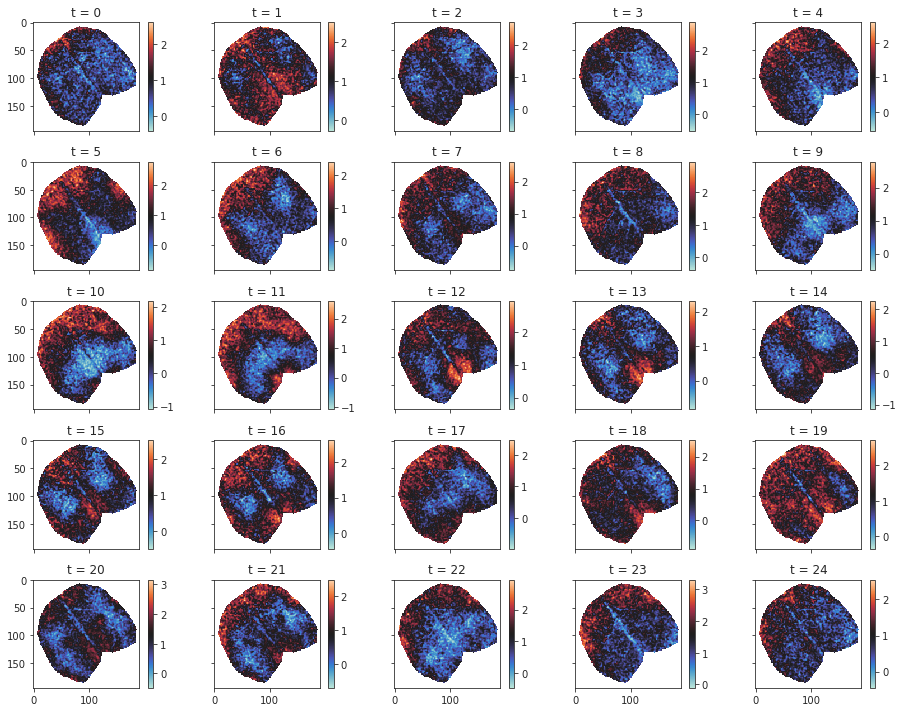

In [287]:
fig, axes = create_figure(5, 5, (13, 10), 'all', 'all')
for ax, t in zip(axes.flat, range(25)):
    x2p = sp_img.gaussian_filter(ca_z[..., t], sigma=1)
    x2p, m_tr = filter_boundaries([x2p, m], m)
    x2p = mwh(m_tr == 0, x2p)
    im = ax.imshow(x2p, cmap='icefire', interpolation='none')
    plt.colorbar(im, ax=ax)
    ax.set_title(f"t = {t}")

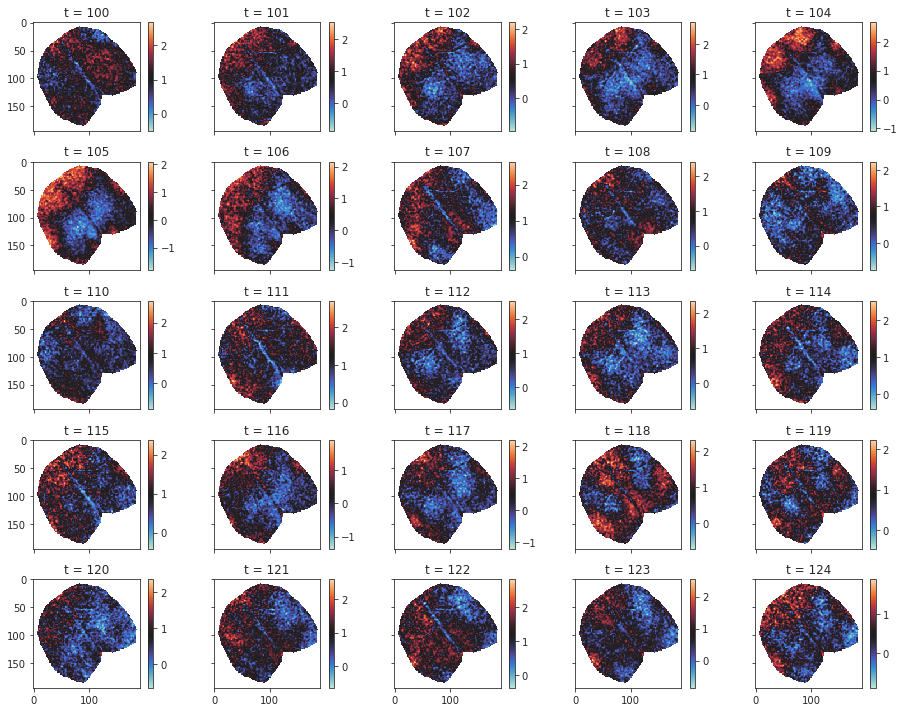

In [288]:
fig, axes = create_figure(5, 5, (13, 10), 'all', 'all')
for ax, t in zip(axes.flat, range(100, 125)):
    x2p = sp_img.gaussian_filter(ca_z[..., t], sigma=1)
    x2p, m_tr = filter_boundaries([x2p, m], m)
    x2p = mwh(m_tr == 0, x2p)
    im = ax.imshow(x2p, cmap='icefire', interpolation='none')
    plt.colorbar(im, ax=ax)
    ax.set_title(f"t = {t}")

## Softmax doesn't really work

In [225]:
ca_sm = np.zeros_like(ca)
ca_sm[m] = sp_spec.softmax(ca[m], axis=0)
ca_sm.shape

(256, 250, 6000)

In [235]:
ca_sm[..., 1500].sum()

1.0

<matplotlib.colorbar.Colorbar object at 0x7fbd601ea370>

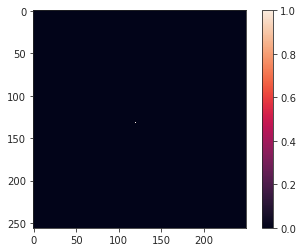

In [237]:
plt.imshow(ca_sm[..., 1500])
plt.colorbar(norm='log')

<matplotlib.colorbar.Colorbar object at 0x7fc2c21769a0>

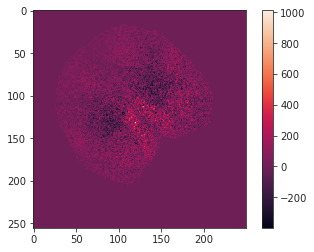

In [239]:
plt.imshow(ca[..., 1500])
plt.colorbar()

In [241]:
a = dc(ca[..., 1500])

<AxesSubplot:ylabel='Count'>

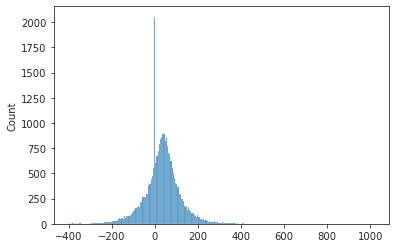

In [243]:
sns.histplot(a[m])

In [244]:
a[a > 400] = 0

<matplotlib.image.AxesImage object at 0x7fc276e26190>

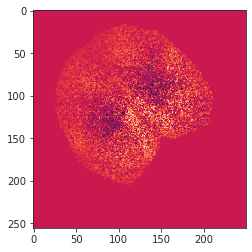

In [245]:
plt.imshow(a)

In [246]:
b = sp_spec.softmax(a)

<matplotlib.image.AxesImage object at 0x7fc2758823a0>

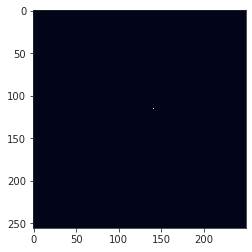

In [247]:
plt.imshow(b)

<matplotlib.image.AxesImage object at 0x7fc2772b7820>

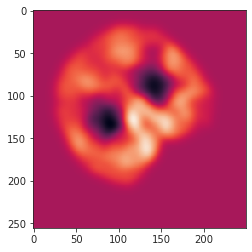

In [262]:
c = sp_img.gaussian_filter(a, sigma=6)
plt.imshow(c)

<matplotlib.image.AxesImage object at 0x7fc288139430>

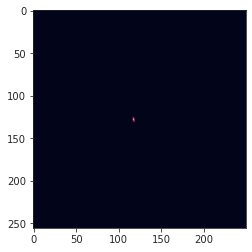

In [263]:
b = sp_spec.softmax(c)
plt.imshow(b)

<matplotlib.image.AxesImage object at 0x7fc277e1bc10>

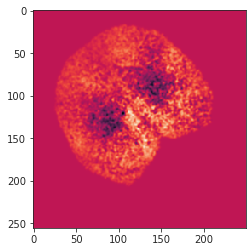

In [286]:
c = sp_img.gaussian_filter(a, sigma=1, order=0)
plt.imshow(c)